In [22]:
# For data analysis
import os
import squeak
import numpy as np
import pandas as pd
from plot_traj import mouseData

# For plotting
import seaborn as sns
import matplotlib.pyplot as plt
from pylab import rcParams
rcParams["figure.figsize"] = 16, 9
# minus in figure
rcParams["axes.unicode_minus"]=False
# chinese in figure
rcParams["font.sans-serif"] = ["Helvetica"]
rcParams["font.family"] = ["Helvetica"]
%matplotlib inline

In [2]:
# set path
data_path = "data"
beh_path = "beh"
new_data_path = "new_data"
embedding_path = "./assets/ChineseEmbedding.txt"
# set task name
foodtask = "foodchoice"
wordtask = "wordchoice"
imagetask = "imagechoice"
witask = "wordimagematch"

## foodchoice

In [3]:
food_df = mouseData(new_data_path, foodtask)

In [4]:
food_df.preprocess()

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


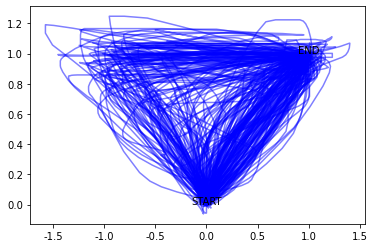

<Figure size 432x288 with 0 Axes>

In [5]:
# space normalize
food_df.plot_normalized_traj(0.05)
plt.savefig("./figures/foodchoice/overall", dpi=300)

In [6]:
food_df.time_normalize()

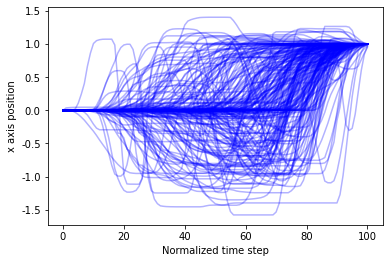

<Figure size 432x288 with 0 Axes>

In [7]:
food_df.plot_normalized_time_x(0.05)
plt.savefig("./figures/foodchoice/step-x", dpi=300)

In [8]:
food_df.time_extend()

In [9]:
# food_df.cal_metrics()

In [10]:
# food_df.print_metrics()

In [74]:
def draw_avg_trajectory(obj, condition, condition0, condition1, title="Food Choice Average Trajectory"):
    condition0_indices = obj.data[obj.data[condition] == condition0].index
    condition1_indices = obj.data[obj.data[condition] == condition1].index
    nx = np.array(list(obj.data.nx)).T
    ny = np.array(list(obj.data.ny)).T
    condition0X = nx[:,condition0_indices].mean(axis=1)
    condition0Y = ny[:,condition0_indices].mean(axis=1)
    condition1X = nx[:,condition1_indices].mean(axis=1)
    condition1Y = ny[:,condition1_indices].mean(axis=1)

    plt.plot(condition0X, condition0Y, '-o', color="#CFEBF7", label=condition0, markersize=2, markeredgecolor="#87CEEB", markerfacecolor="#87CEEB")
    plt.plot(condition1X, condition1Y, '-o', color="#FF9999", label=condition1, markersize=2, markeredgecolor="#FF0000", markerfacecolor="#FF0000")
    plt.legend(loc="lower right", fontsize=15)
    # plt.title(title)
    plt.xlim((-.15, 1.05))
    plt.ylim((-.05, 1.1))
    # plt.show()
    plt.savefig("./figures/" + title + "/traj-animacy", dpi=500, bbox_inches="tight")

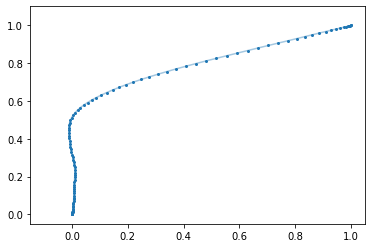

In [55]:
nx = np.array(list(food_df.data.nx)).T
ny = np.array(list(food_df.data.ny)).T
plt.plot(nx.mean(axis=1), ny.mean(axis=1), '-o', color="#A5C8E1", markersize=2, markeredgecolor="#1F77B4", markerfacecolor="#1F77B4")
plt.xlim((-.15, 1.05))
plt.ylim((-.05, 1.1))
plt.savefig("./figures/foodchoice/traj-animacy", dpi=500, bbox_inches="tight")

## wordchoice

In [41]:
word_df = mouseData(new_data_path, wordtask)

In [42]:
word_df.preprocess()

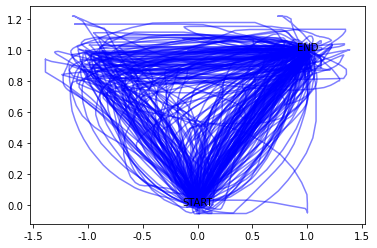

<Figure size 432x288 with 0 Axes>

In [43]:
# space normalize
word_df.plot_normalized_traj(0.05)
plt.savefig("./figures/wordchoice/overall", dpi=300)

In [44]:
# normalize time to 101 points
word_df.time_normalize()

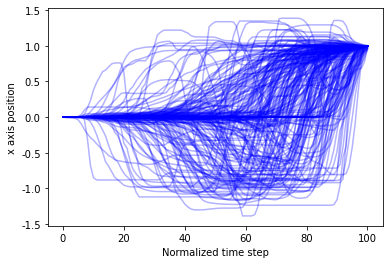

<Figure size 432x288 with 0 Axes>

In [45]:
word_df.plot_normalized_time_x(0.05)
plt.savefig("./figures/wordchoice/step-x", dpi=300)

In [46]:
## normalize time by extend list
word_df.time_extend()

In [47]:
# word_df.cal_metrics()

In [48]:
# word_df.print_metrics()

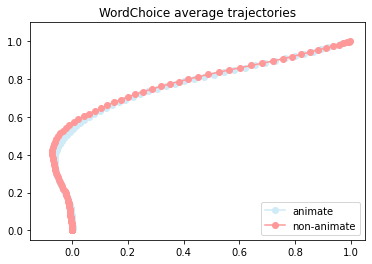

<Figure size 432x288 with 0 Axes>

In [23]:
word_df.draw_avg_trajectory("animacy", "animate", "non-animate", "WordChoice average trajectories")
plt.savefig("./figures/wordchoice/traj-animacy", dip=300)

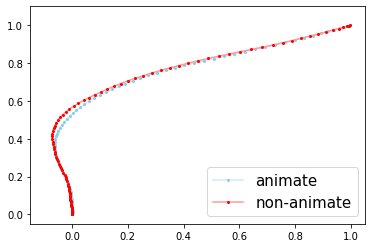

In [72]:
draw_avg_trajectory(word_df, "animacy", "animate", "non-animate", "wordchoice")

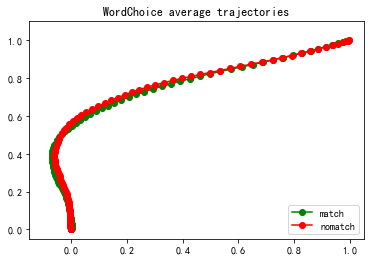

<Figure size 432x288 with 0 Axes>

In [79]:
word_df.draw_avg_trajectory("relation", "match", "nomatch", "WordChoice average trajectories")
plt.savefig("./figures/wordchoice/traj-match", dip=300)

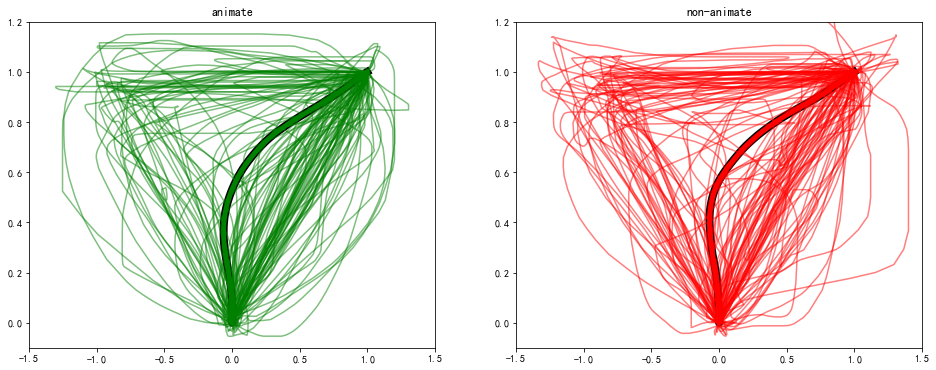

<Figure size 432x288 with 0 Axes>

In [80]:
word_df.draw_avg_trajectory_and_normal("animacy", "animate", "non-animate", 0.05)
plt.savefig("./figures/wordchoice/traj-animacy-split", dip=300)

In [14]:
# plt.figure(figsize=(16,10))
# variables = [nx, ny, rx, ry]
# labels_x = np.repeat(['Normalized time', 'Real time'], 2)
# labels_y = np.tile(["X axis", "Y axis"], 2)

# truth_indices = data[data.condition=='truth'].index
# lie_indices = data[data.condition=='lie'].index

# for i in range(4):
#     plt.subplot(2, 2, i+1)
#     v = variables[i] # Our dependant variable
#     truthV = v.iloc[truth_indices].mean()
#     lieV = v.iloc[lie_indices].mean()
#     ind = truthV.index.values # The appropriate scale for the x axis
#     plt.plot(ind, truthV, 'green', label='Truth')
#     plt.plot(ind, lieV, 'red', label='Lies')
#     plt.xlabel(labels_x[i])
#     plt.ylabel(labels_y[i])
#     plt.legend(loc="lower right")
# plt.show()

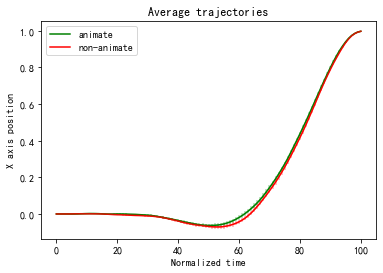

<Figure size 432x288 with 0 Axes>

In [81]:
word_df.plot_avg_x("animacy", "animate", "non-animate")
plt.savefig("./figures/wordchoice/avg-step-x", dip=300)

## imageChoice

In [63]:
image_df = mouseData(new_data_path, imagetask)

In [64]:
image_df.preprocess()

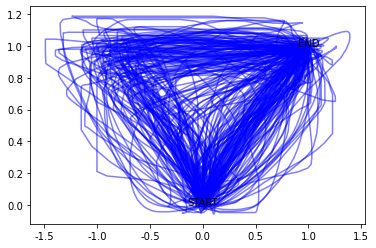

<Figure size 432x288 with 0 Axes>

In [65]:
# space normalize
image_df.plot_normalized_traj(0.05)
plt.savefig("./figures/imagechoice/overall", dpi=300)

In [66]:
# normalize time to 101 points
image_df.time_normalize()

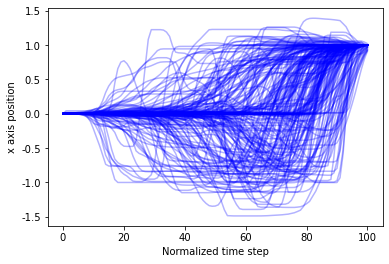

<Figure size 432x288 with 0 Axes>

In [67]:
image_df.plot_normalized_time_x(0.05)
plt.savefig("./figures/imagechoice/step-x", dip=300)

In [68]:
# normalize time by extend list
image_df.time_extend()

In [22]:
# image_df.cal_metrics()

In [69]:
# image_df.print_metrics()

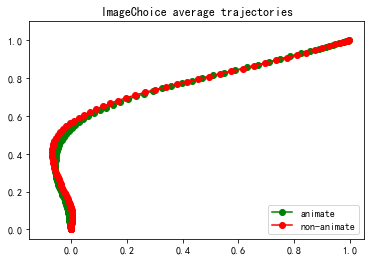

<Figure size 432x288 with 0 Axes>

In [84]:
image_df.draw_avg_trajectory("animacy", "animate", "non-animate", "ImageChoice average trajectories")
plt.savefig("./figures/imagechoice/traj-animacy", dpi=300)

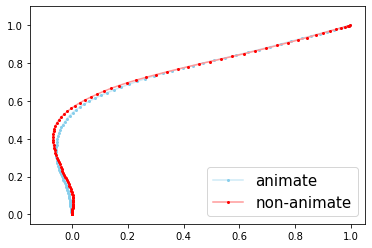

In [73]:
draw_avg_trajectory(image_df, "animacy", "animate", "non-animate", "imagechoice")

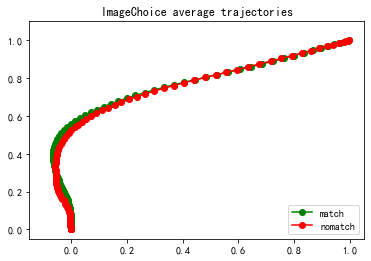

<Figure size 432x288 with 0 Axes>

In [85]:
image_df.draw_avg_trajectory("relation", "match", "nomatch", "ImageChoice average trajectories")
plt.savefig("./figures/imagechoice/traj-match", dpi=300)

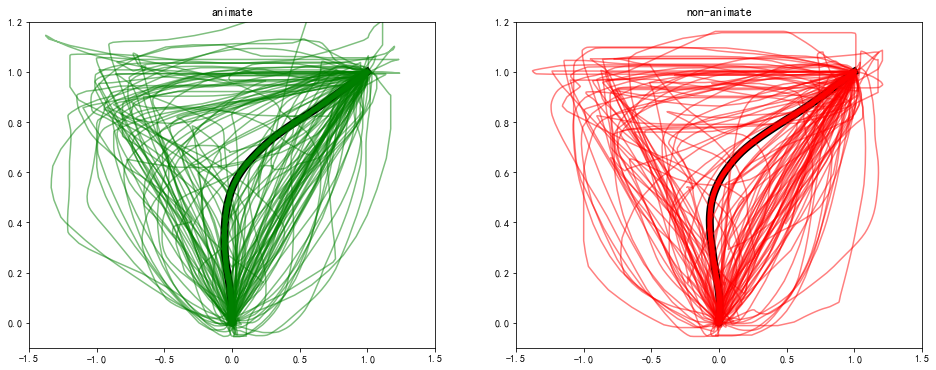

<Figure size 432x288 with 0 Axes>

In [86]:
image_df.draw_avg_trajectory_and_normal("animacy", "animate", "non-animate", 0.05)
plt.savefig("./figures/imagechoice/traj-animacy-split", dpi=300)

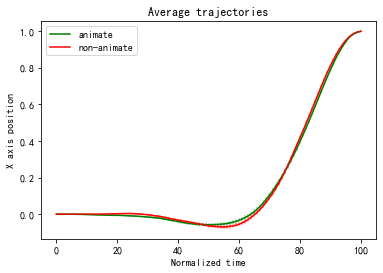

<Figure size 432x288 with 0 Axes>

In [87]:
image_df.plot_avg_x("animacy", "animate", "non-animate")
plt.savefig("./figures/imagechoice/avg-step-x", dpi=300)

## avg trajectory between image and word

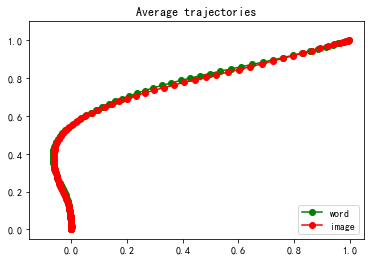

<Figure size 432x288 with 0 Axes>

In [88]:
wnx = np.array(list(word_df.data.nx)).T.mean(axis=1)
wny = np.array(list(word_df.data.ny)).T.mean(axis=1)

inx = np.array(list(image_df.data.nx)).T.mean(axis=1)
iny = np.array(list(image_df.data.ny)).T.mean(axis=1)

plt.plot(wnx, wny, '-o', color='green', label="word")
plt.plot(inx, iny, '-o', color='red', label="image")
plt.legend(loc="lower right")
plt.title("Average trajectories")
plt.xlim((-.15, 1.05))
plt.ylim((-.05, 1.1))
plt.show()
plt.savefig("./figures/avg-traj-stimuli", dpi=300)

## wordimagematch

In [29]:
wi_df = mouseData(new_data_path, witask)

In [30]:
wi_df.preprocess()

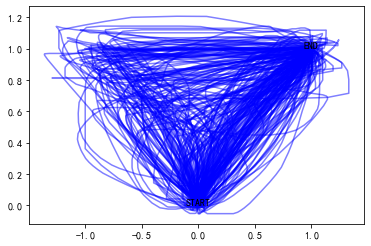

<Figure size 432x288 with 0 Axes>

In [89]:
wi_df.plot_normalized_traj(0.05)
plt.savefig("./figures/wimatch/overall", dpi=300)

In [32]:
# normalize time to 101 points
wi_df.time_normalize()

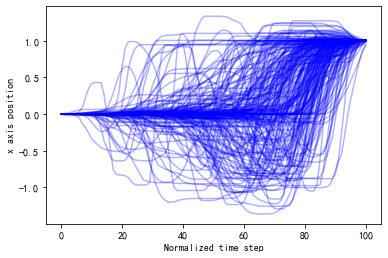

<Figure size 432x288 with 0 Axes>

In [90]:
wi_df.plot_normalized_time_x(0.05)
plt.savefig("./figures/wimatch/step-x", dpi=300)

In [34]:
## normalize time by extend list
wi_df.time_extend()

In [35]:
wi_df.cal_metrics()

In [36]:
wi_df.print_metrics("relation")

                md       auc    xflips           rt
relation                                           
match     0.457127  0.298896  0.165913  1414.148106
nomatch   0.613591  0.372617  0.250215  1574.273431


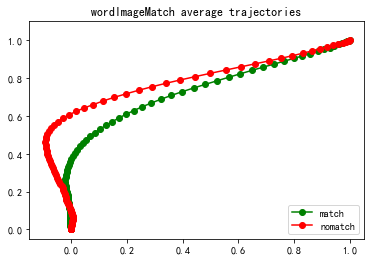

<Figure size 432x288 with 0 Axes>

In [91]:
wi_df.draw_avg_trajectory("relation", "match", "nomatch", "wordImageMatch average trajectories")
plt.savefig("./figures/wimatch/traj-match", dpi=300)

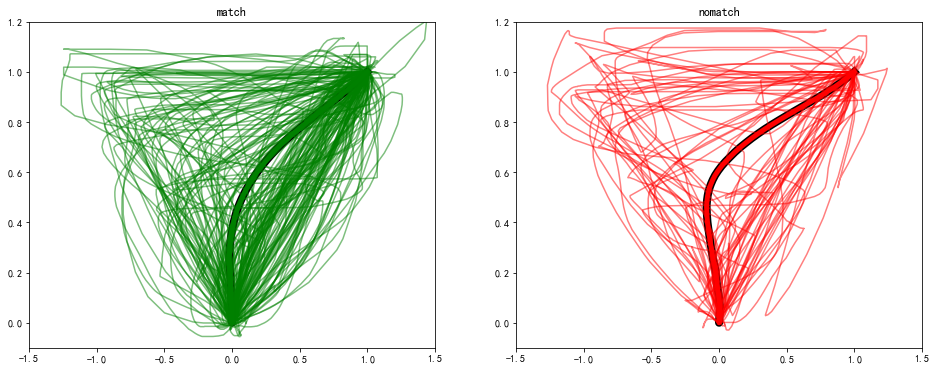

<Figure size 432x288 with 0 Axes>

In [92]:
wi_df.draw_avg_trajectory_and_normal("relation", "match", "nomatch", 0.05)
plt.savefig("./figures/wimatch/traj-match-split", dip=300)

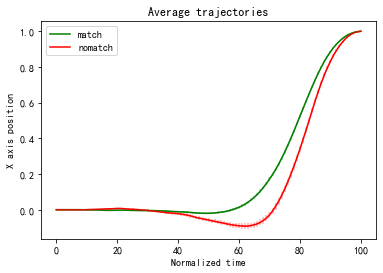

<Figure size 432x288 with 0 Axes>

In [93]:
wi_df.plot_avg_x("relation", "match", "nomatch")
plt.savefig("./figures/wimatch/avg-step-x", dip=300)

## wordEmbedding

In [40]:
from sklearn.metrics.pairwise import cosine_similarity
from gensim.models.keyedvectors import KeyedVectors

In [41]:
words = list(set(word_df.data["item"].sample(30)))

In [42]:
# read embedding
w2v = KeyedVectors.load_word2vec_format(embedding_path, binary=False)
# normalize vectors
w2v.init_sims(replace=True)
# get vectors of word stimulus
vec_matrix = np.array([w2v[word] for word in words])
# get cosin similarity of words
cosine_matrix = np.dot(vec_matrix, vec_matrix.T)

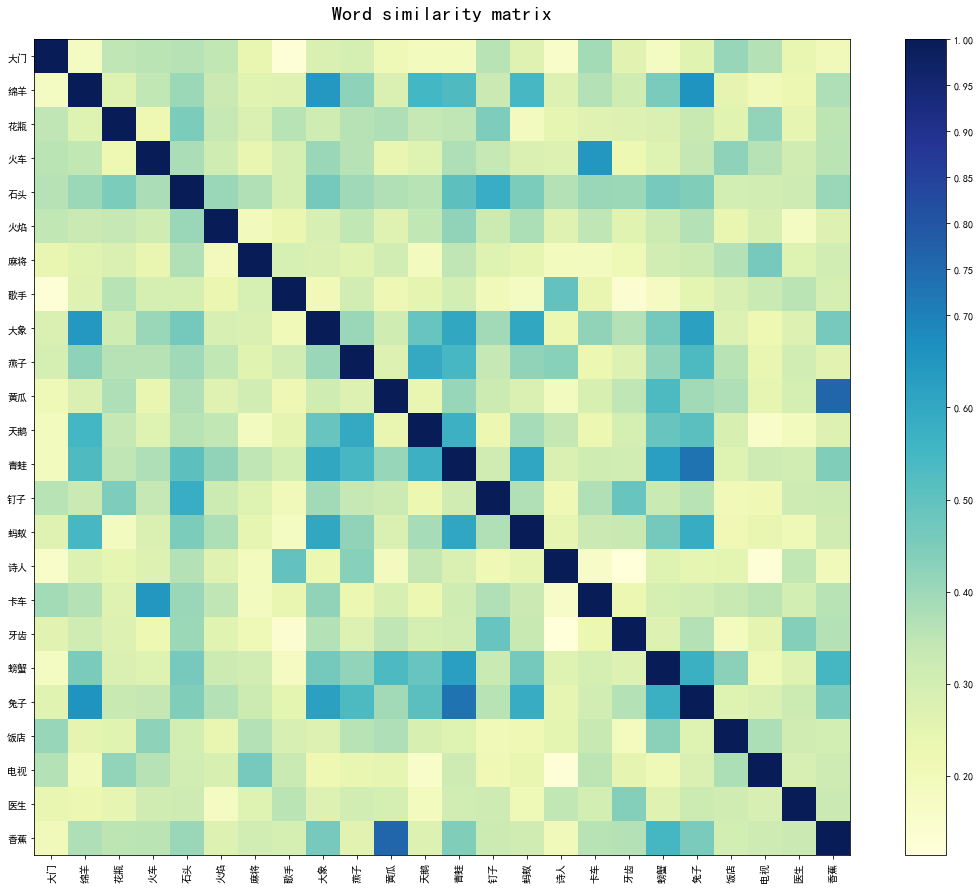

<Figure size 432x288 with 0 Axes>

In [95]:
from matplotlib import cm as cm
# cmap = cm.get_cmap("Greens")
cmap = cm.get_cmap("YlGnBu")
# cmap = cm.get_cmap("RdYlGn")

fig, ax = plt.subplots(figsize=(20,15))
cax = ax.matshow(cosine_matrix, interpolation="nearest", cmap=cmap)
# ax.grid(True)
plt.title("Word similarity matrix", fontdict={"fontsize": 20}, pad=20)
plt.xticks(range(len(words)), words, rotation=90)
plt.yticks(range(len(words)), words)
ax.xaxis.set_ticks_position("bottom")
ax.yaxis.set_ticks_position("left")
fig.colorbar(cax, ticks=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, .75,.8,.85,.90,.95,1])
plt.show()
plt.savefig("./figures/semantic", dip=500)

In [44]:
# plt.subplots(figsize=(20,15))
# sns.heatmap(cosine_matrix, xticklabels=words, yticklabels=words, square=True, vmin=0, vmax=1, cmap="YlGnBu")
# plt.xticks(fontsize=10)
# plt.yticks(fontsize=10, multialignment="center")
# plt.title("Word similarity matrix", fontdict={"fontsize": 20}, pad=20)
# plt.show()

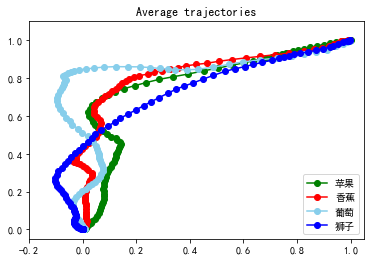

In [75]:
# sns.set(font='SimHei', style=None)
colors = ["green", "red", "skyblue", "blue"]
items = ["苹果", "香蕉", "葡萄", "狮子"]
for color, item in zip(colors, items):
    nx = np.array(list(word_df.data[word_df.data["item"] == item]["nx"])).T.mean(axis=1)
    ny = np.array(list(word_df.data[word_df.data["item"] == item]["ny"])).T.mean(axis=1)
    plt.plot(nx, ny, '-o', color=color, label=item)

plt.legend(loc="lower right")
plt.title("Average trajectories")
plt.xlim((-.2, 1.05))
plt.ylim((-.05, 1.1))
plt.show()

In [72]:
item = "苹果"
traj_A = np.array(list(zip(np.array(list(word_df.data[word_df.data["item"] == item]["nx"])).T.mean(axis=1), np.array(list(word_df.data[word_df.data["item"] == item]["ny"])).T.mean(axis=1))))
item = "葡萄"
traj_B = np.array(list(zip(np.array(list(word_df.data[word_df.data["item"] == item]["nx"])).T.mean(axis=1), np.array(list(word_df.data[word_df.data["item"] == item]["ny"])).T.mean(axis=1))))

In [73]:
traj_A.shape

(101, 2)

In [74]:
import traj_dist.distance as tdist
tdist.sspd(traj_A, traj_B)

0.055640656580757404